In [1]:
import numpy as np
import pandas as pd
from glob import glob

In [2]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [3]:
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('darkgrid')
sns.set_context('notebook')

# 1. Target values

## 1.1. Load target values

In [4]:
# Load Train Scores
targets = pd.read_csv('train_scores.csv').set_index('Id')
targets.head(5)

,age,domain1_var1,domain1_var2,domain2_var1,domain2_var2
Id,,,,,
10001,57.436077,30.571975,62.553736,53.325130,51.427998
10002,59.580851,50.969456,67.470628,60.651856,58.311361
10004,71.413018,53.152498,58.012103,52.418389,62.536641
10005,66.532630,NaN,NaN,52.108977,69.993075
10007,38.617381,49.197021,65.674285,40.151376,34.096421


In [5]:
# How many missing values
targets.isnull().sum()

age               0
domain1_var1    438
domain1_var2    438
domain2_var1     39
domain2_var2     39
dtype: int64

In [6]:
# Shape of dataset
targets.shape

(5877, 5)

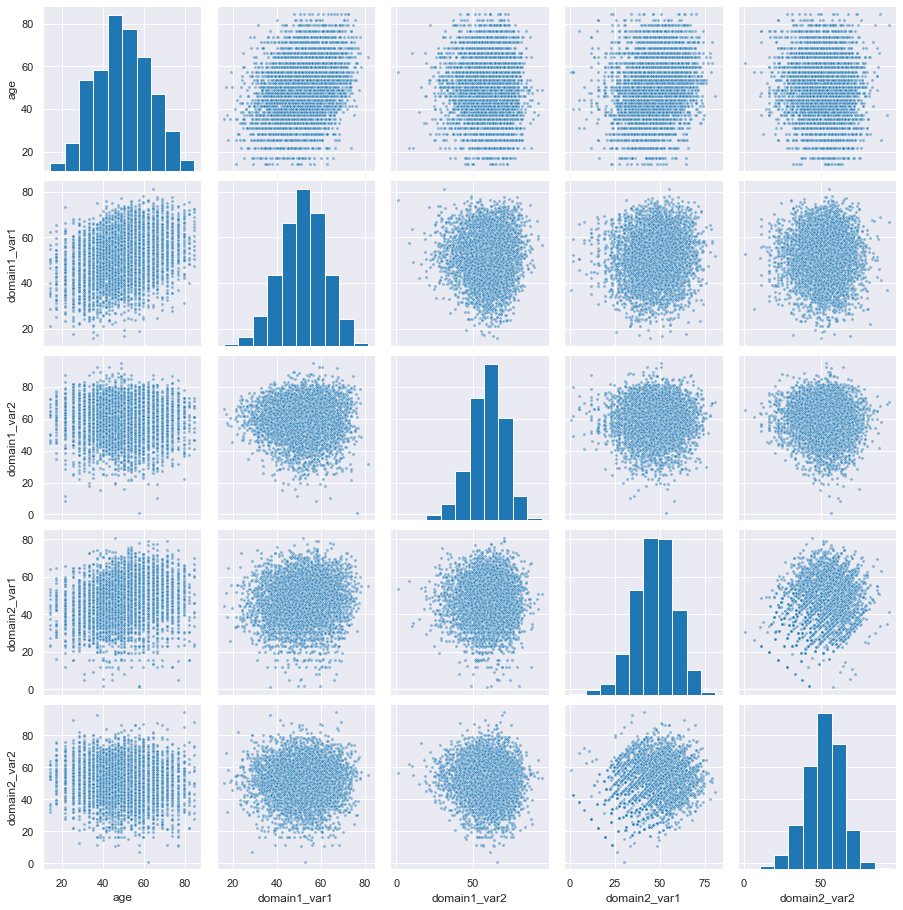

In [7]:
# Plot relationship between targets
sns.pairplot(targets.dropna(), plot_kws=dict(s=10, edgecolor="w", linewidth=0.5, alpha=0.5));

## 1.2. Explore target values

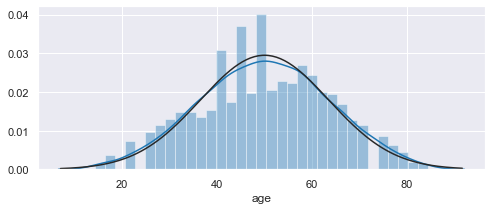

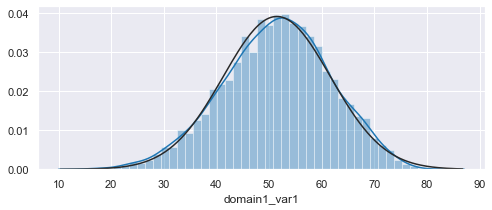

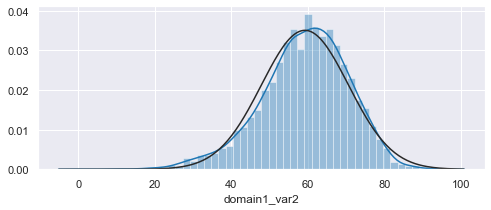

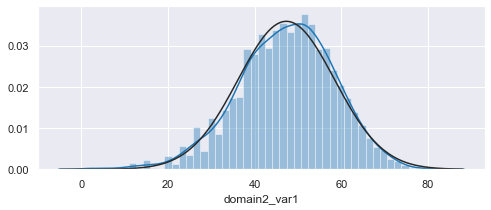

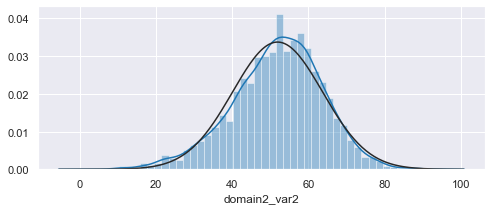

In [8]:
from scipy.stats import norm
for col in targets.columns:
    plt.figure(figsize=(8, 3))
    sns.distplot(targets[col].dropna(), fit=norm, kde=True)
    plt.show()

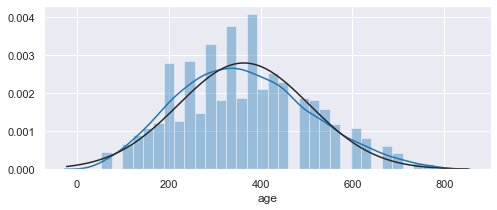

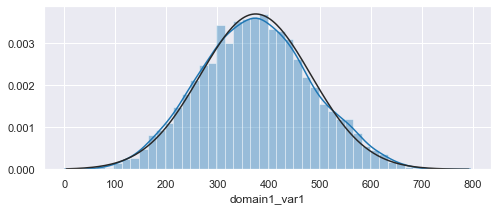

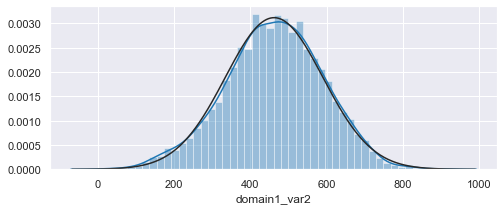

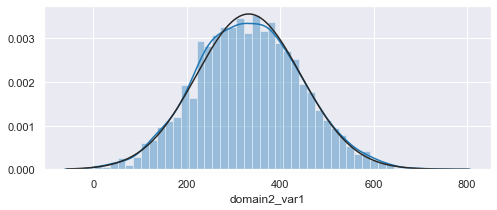

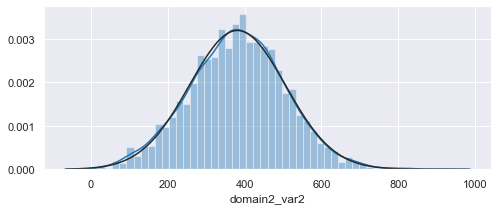

In [9]:
from scipy.stats import norm
for col in targets.columns:
    plt.figure(figsize=(8, 3))
    sns.distplot(np.power(targets[col].dropna(), 1.5), fit=norm, kde=True)
    plt.show()

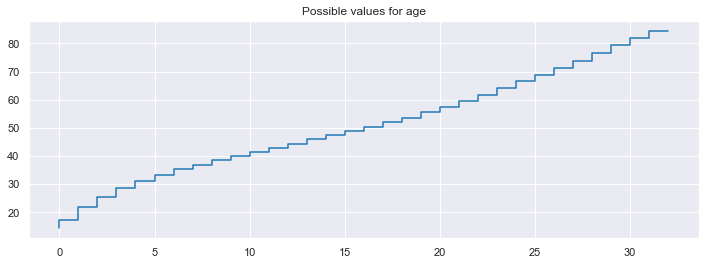

In [10]:
# Exploration of age values
age_values = np.unique(targets.age)

plt.figure(figsize=(12, 4))
plt.title('Possible values for age')
plt.step(*np.array([(i, e) for i, e in enumerate(age_values)]).T);

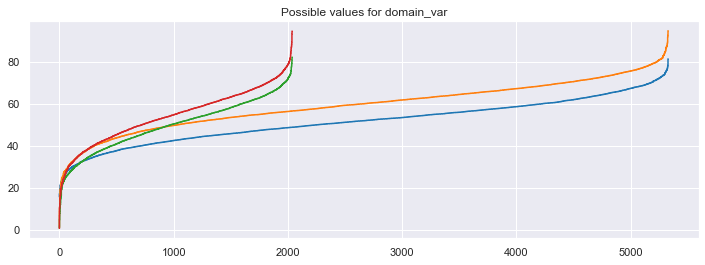

In [11]:
# Exploration of other values
d1v1_values = np.unique(targets.domain1_var1)
d1v2_values = np.unique(targets.domain1_var2)
d2v1_values = np.unique(targets.domain2_var1)
d2v2_values = np.unique(targets.domain2_var2)

plt.figure(figsize=(12, 4))
plt.title('Possible values for domain_var')
plt.step(*np.array([(i, e) for i, e in enumerate(d1v1_values)]).T);
plt.step(*np.array([(i, e) for i, e in enumerate(d1v2_values)]).T);
plt.step(*np.array([(i, e) for i, e in enumerate(d2v1_values)]).T);
plt.step(*np.array([(i, e) for i, e in enumerate(d2v2_values)]).T);

# 2. Prepare Feature Matrices

## 2.1. Load feature datasets

In [12]:
# Extract ID for train and test set
train_id = targets.index.values
sample_submission = pd.read_csv('sample_submission.csv')
test_id = np.unique(sample_submission.Id.str.split('_', expand=True)[0].astype('int'))

In [13]:
# Load ICA file
df_ica = pd.read_csv('loading.csv')
df_ica.shape

(11754, 27)

In [14]:
# Load FNC files
df_fnc = pd.read_csv('fnc.csv')
df_fnc.shape

(11754, 1379)

In [15]:
# Separate train/test for ICA components
ica_train = df_ica[df_ica.Id.isin(train_id)].set_index('Id')
ica_test = df_ica[df_ica.Id.isin(test_id)].set_index('Id')
print(ica_train.shape, ica_test.shape)

(5877, 26) (5877, 26)


In [16]:
# Separate train/test for FNC components
fnc_train = df_fnc[df_fnc.Id.isin(train_id)].set_index('Id')
fnc_test = df_fnc[df_fnc.Id.isin(test_id)].set_index('Id')
print(fnc_train.shape, fnc_test.shape)

(5877, 1378) (5877, 1378)


In [17]:
# Load brain correlation components
brain_corr_train = pd.read_csv('datasets/brain_corr_raw_train.csv')
brain_corr_train = brain_corr_train.rename(columns={'Unnamed: 0': 'Id'}).set_index('Id')
brain_corr_test = pd.read_csv('datasets/brain_corr_raw_test.csv')
brain_corr_test = brain_corr_test.rename(columns={'Unnamed: 0': 'Id'}).set_index('Id')
print(brain_corr_train.shape, brain_corr_test.shape)

(5875, 1378) (5877, 1378)


In [18]:
def combine_brain_values(didx='train'):

    # List of file names
    csv_files = sorted(glob('datasets/brain_values_raw_%s_*.csv' % didx))

    # Create empty ID list
    merger = pd.read_csv(csv_files[0]).set_index('Id')
    merger.columns = [c + '_%02d' % 1 for c in merger.columns]

    # Go through files and concatenate them
    for i, f in enumerate(csv_files[1:]):

        new_df = pd.read_csv(f).set_index('Id')
        new_df.columns = [c + '_%02d' % (i + 2) for c in new_df.columns]

        merger = pd.merge(merger, new_df, on='Id')

    return merger

In [19]:
# Load brain value components
brain_value_train = combine_brain_values(didx='train')
brain_value_test = combine_brain_values(didx='test')
print(brain_value_train.shape, brain_value_test.shape)

(5875, 2226) (5877, 2226)


In [20]:
# Drop irrelevant columns
cignore = ['perc-1_region',
           'perc-99_region',
           'perc-0.1_whole',
           'perc-1_whole',
           'perc-99_whole',
           'perc-99.9_whole',
           'perc-50_gm',
           'perc-50_wm',
           'perc-50_csf',
           'cjv',
           'snr_wm',
           'whole_std',
           'wm2max_csf',
           'wm2max_gm']

idx_keep = np.sum([brain_value_train.columns.str.contains(c) for c in cignore], axis=0)==0
brain_value_train = brain_value_train.iloc[:, idx_keep]
print(brain_value_train.shape)

idx_keep = np.sum([brain_value_test.columns.str.contains(c) for c in cignore], axis=0)==0
brain_value_test = brain_value_test.iloc[:, idx_keep]
print(brain_value_test.shape)

(5875, 1484)
(5877, 1484)


In [21]:
def combine_brain_voxels(didx='train'):

    # List of file names
    csv_files = sorted(glob('datasets/brain_vox_raw_%s_*.csv' % didx))

    # Create empty ID list
    merger = pd.read_csv(csv_files[0]).set_index('Id')

    # Go through files and concatenate them
    for i, f in enumerate(csv_files[1:]):
        new_df = pd.read_csv(f).set_index('Id')
        merger = pd.merge(merger, new_df, on='Id')

    return merger

In [22]:
# Load brain value components
brain_voxel_train = combine_brain_voxels(didx='train')
brain_voxel_test = combine_brain_voxels(didx='test')
print(brain_voxel_train.shape, brain_voxel_test.shape)

(5875, 1058) (5877, 1058)


## Create merged dataset

In [23]:
# Create merged dataset
merge_train = pd.merge(ica_train.reset_index(), fnc_train.reset_index()).set_index('Id')
merge_train = pd.merge(merge_train, brain_corr_train, left_index=True, right_index=True)
merge_train = pd.merge(merge_train, brain_value_train, left_index=True, right_index=True)
merge_train = pd.merge(merge_train, brain_voxel_train, left_index=True, right_index=True)
print(merge_train.shape)

merge_test = pd.merge(ica_test.reset_index(), fnc_test.reset_index()).set_index('Id')
merge_test = pd.merge(merge_test, brain_corr_test, left_index=True, right_index=True)
merge_test = pd.merge(merge_test, brain_value_test, left_index=True, right_index=True)
merge_test = pd.merge(merge_test, brain_voxel_test, left_index=True, right_index=True)
print(merge_test.shape)

(5875, 5324)
(5877, 5324)


In [24]:
# Detect very frequent extrem values with z-score outliers
df_zscore = (merge_train - merge_train.mean())/merge_train.std()

extrem_ids = []
for above_std, how_many_times in [[4, 50], [5, 25], [6, 10]]:

    # Detect extrem values
    extrem_values = np.sum(df_zscore.abs()>=above_std, axis=1)>=how_many_times
    new_extrems = list(np.array(merge_train[extrem_values].index))
    extrem_ids.extend(new_extrems)
    print(len(new_extrems))
extrem_ids = np.unique(extrem_ids)
print(len(extrem_ids))
extrem_ids

19
11
43
49


array([10318, 10586, 10612, 10668, 10775, 10881, 11230, 11382, 11552,
       11947, 12181, 12393, 12608, 12811, 12925, 13068, 13130, 13213,
       13280, 13865, 14100, 14256, 14639, 14676, 14750, 14753, 15696,
       16377, 16695, 17051, 17201, 17446, 17702, 17778, 17855, 18075,
       18549, 19431, 19802, 19914, 19946, 19955, 20355, 20606, 20717,
       20854, 21086, 21298, 21301])

## 2.2. Explore feature datasets and check for outliers

In [25]:
# Outliers discovered through line plots below
outliers = np.ravel([fnc_train[fnc_train['VSN(16)_vs_SCN(69)']>=0.5].index.values])
outliers = np.hstack((outliers, ica_train[ica_train['IC_02']<-0.02].index.values))
outliers = np.hstack((outliers, np.array([t for t in train_id if not np.isin(t, ica_train.index.values)])))
outliers = np.hstack((outliers, np.array([t for t in train_id if not np.isin(t, fnc_train.index.values)])))
outliers = np.hstack((outliers, np.array([t for t in train_id if not np.isin(t, brain_corr_train.index.values)])))
outliers = np.hstack((outliers, np.array([t for t in train_id if not np.isin(t, brain_value_train.index.values)])))
outliers = np.hstack((outliers, np.array([t for t in train_id if not np.isin(t, brain_voxel_train.index.values)])))
outliers = np.hstack((outliers, extrem_ids))
outliers = np.unique(outliers)
print(len(outliers))
outliers

52


array([10318., 10586., 10612., 10668., 10775., 10840., 10881., 11230.,
       11382., 11552., 11947., 12181., 12393., 12608., 12811., 12925.,
       13068., 13130., 13213., 13280., 13632., 13865., 14100., 14256.,
       14639., 14676., 14750., 14753., 15696., 16377., 16695., 17051.,
       17201., 17446., 17702., 17778., 17855., 18075., 18549., 19431.,
       19802., 19914., 19946., 19955., 20355., 20606., 20717., 20854.,
       21086., 21298., 21301., 21467.])

In [26]:
# Remove outliers from dataframes
ica_train = ica_train.drop(outliers, errors='ignore')
fnc_train = fnc_train.drop(outliers, errors='ignore')
brain_corr_train = brain_corr_train.drop(outliers, errors='ignore')
brain_value_train = brain_value_train.drop(outliers, errors='ignore')
brain_voxel_train = brain_voxel_train.drop(outliers, errors='ignore')
merge_train = merge_train.drop(outliers, errors='ignore')
print(ica_train.shape, fnc_train.shape,
      brain_corr_train.shape, brain_value_train.shape, brain_voxel_train.shape,
      merge_train.shape)

(5825, 26) (5825, 1378) (5825, 1378) (5825, 1484) (5825, 1058) (5825, 5324)


## 2.3. Recode targets and save scaler

In [27]:
targets = pd.read_csv('train_scores.csv').set_index('Id')
targets = targets.drop(outliers, errors='ignore')
targets

,age,domain1_var1,domain1_var2,domain2_var1,domain2_var2
Id,,,,,
10001,57.436077,30.571975,62.553736,53.325130,51.427998
10002,59.580851,50.969456,67.470628,60.651856,58.311361
10004,71.413018,53.152498,58.012103,52.418389,62.536641
10005,66.532630,NaN,NaN,52.108977,69.993075
10007,38.617381,49.197021,65.674285,40.151376,34.096421
...,...,...,...,...,...
21746,14.257265,21.358872,61.165998,51.778483,54.640179
21747,55.456978,68.169675,29.907995,55.349257,54.019517
21750,48.948756,55.114811,60.878271,38.617246,50.679885


In [28]:
# Wether or not to transform feature 2 to 5
feature_transform = True
if feature_transform:
    for col in targets.columns[1:]:
        targets[col] = np.power(targets[col], 1.5)

In [29]:
# Rescale target
scaler_targets = StandardScaler()
indeces = targets.index.values
targets = pd.DataFrame(scaler_targets.fit_transform(targets), columns=targets.columns)
targets.index = indeces
targets.index.rename('Id', inplace=True)
targets

,age,domain1_var1,domain1_var2,domain2_var1,domain2_var2
Id,,,,,
10001,0.547617,-1.899642,0.250808,0.508039,-0.099976
10002,0.705878,-0.099936,0.715255,1.248611,0.512129
10004,1.578962,0.118291,-0.162293,0.419745,0.906467
10005,1.218843,NaN,NaN,0.389789,1.635162
10007,-0.840996,-0.273720,0.543540,-0.697062,-1.458442
...,...,...,...,...,...
21746,-2.638505,-2.549216,0.122934,0.357891,0.180885
21747,0.401581,1.737727,-2.335907,0.707850,0.125956
21750,-0.078654,0.318321,0.096601,-0.825992,-0.164158


In [30]:
# Store targets in CSV file
targets.to_csv('datasets/targets.csv')

import joblib
joblib.dump(scaler_targets, 'datasets/targets_scaler.pkl');

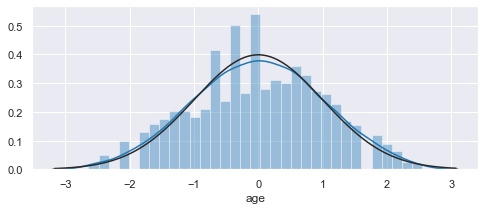

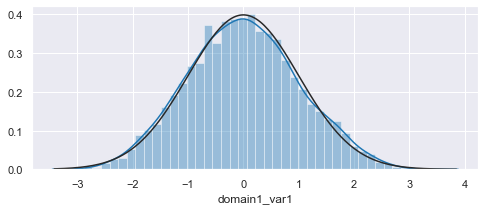

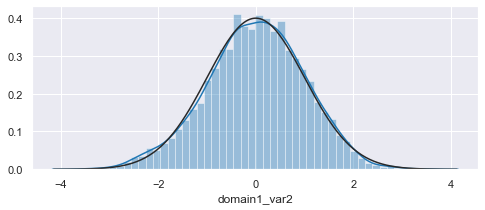

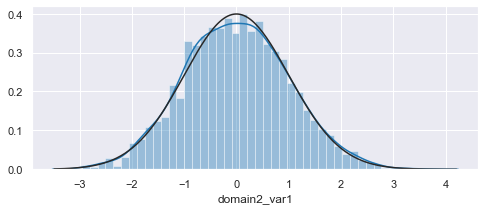

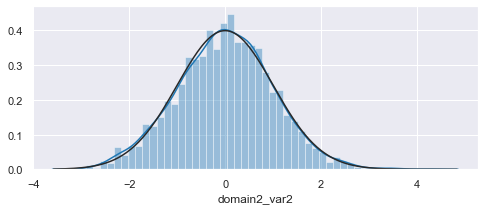

In [31]:
from scipy.stats import norm
for col in targets.columns:
    plt.figure(figsize=(8, 3))
    sns.distplot(targets[col].dropna(), fit=norm, kde=True)
    plt.show()

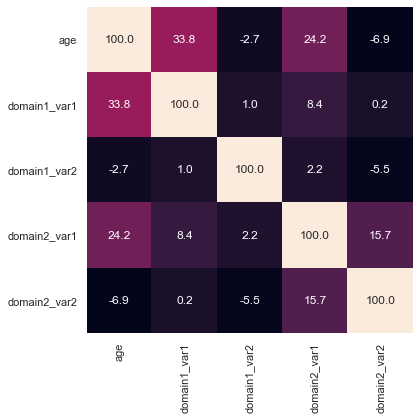

In [32]:
# Plot Correlation matrix
plt.figure(figsize=(6, 6))
sns.heatmap(100 * targets.corr(), square=True, annot=True, fmt='.1f', cbar=False);

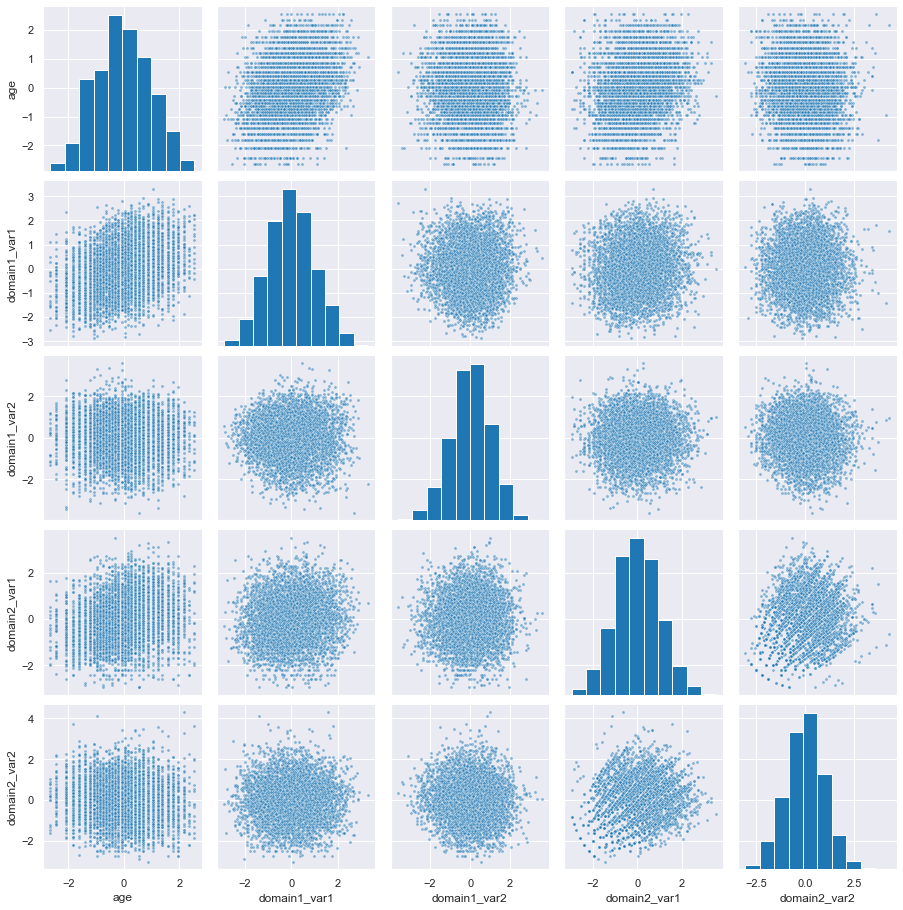

In [33]:
# Plot relationship between targets
sns.pairplot(targets.dropna(), plot_kws=dict(s=10, edgecolor="w", linewidth=0.5, alpha=0.5));

## 2.4. Create composition datasets

In [34]:
new_ids = np.logical_and(~merge_train.columns.str.contains('IC_'), ~merge_train.columns.str.contains('_vs_'))
def_new_values_train = merge_train.iloc[:, new_ids]
def_new_values_test = merge_test.iloc[:, new_ids]

display(def_new_values_train.head())
display(def_new_values_test.head())

,c01_c02,c01_c03,c01_c04,c01_c05,c01_c06,c01_c07,c01_c08,c01_c09,c01_c10,c01_c11,...,vox_corr_idx53_c11,vox_corr_idx53_c12,vox_corr_idx53_c13,vox_corr_idx53_c14,vox_corr_idx53_c15,vox_corr_idx53_c16,vox_corr_idx53_c17,vox_corr_idx53_c18,vox_corr_idx53_c19,vox_corr_idx53_c20
Id,,,,,,,,,,,,,,,,,,,,,
10001,0.003793,-0.054252,0.294854,0.144682,-0.045360,0.027675,0.015077,-0.009131,-0.049143,-0.041198,...,-0.509203,0.730265,1.973415,1.402835,0.925947,0.709888,-0.230173,-0.449528,-0.308647,1.478304
10002,-0.017048,0.017500,0.357617,0.203697,-0.023610,0.026548,0.014621,-0.048291,-0.057318,-0.043074,...,1.086352,0.154981,1.821448,1.614572,0.160715,0.654848,0.260704,0.833131,-0.167106,-0.819111
10004,-0.023082,-0.053769,0.324092,0.106574,-0.037392,-0.015338,-0.011107,-0.032104,-0.005373,-0.022463,...,-0.053502,-0.100933,1.149104,0.787808,0.736173,-0.220602,-0.873311,-0.805072,-0.130779,-0.748791
10005,0.032158,-0.033263,0.293245,0.146990,-0.079437,-0.012511,-0.028880,0.025037,-0.065758,-0.034499,...,0.722762,0.144458,1.391204,1.199510,0.580479,0.620608,0.423729,-0.042814,1.187751,0.247741
10007,-0.009758,0.041962,0.468049,0.143850,-0.080721,-0.011312,-0.080157,-0.097179,0.031653,-0.020620,...,0.630356,0.323019,2.561267,1.894119,0.597307,0.742979,0.152290,-0.179815,-0.312042,-1.099807


,c01_c02,c01_c03,c01_c04,c01_c05,c01_c06,c01_c07,c01_c08,c01_c09,c01_c10,c01_c11,...,vox_corr_idx53_c11,vox_corr_idx53_c12,vox_corr_idx53_c13,vox_corr_idx53_c14,vox_corr_idx53_c15,vox_corr_idx53_c16,vox_corr_idx53_c17,vox_corr_idx53_c18,vox_corr_idx53_c19,vox_corr_idx53_c20
Id,,,,,,,,,,,,,,,,,,,,,
10003,0.005226,0.002416,0.457138,0.182916,-0.072821,0.035330,-0.036291,-0.046085,-0.067620,-0.005907,...,-0.380543,-0.449889,0.069027,-0.312562,-0.474914,1.464480,-0.703794,0.031581,1.209362,-0.227391
10006,-0.012475,-0.068023,0.376085,0.162062,-0.082998,-0.035827,-0.011186,-0.007721,-0.073489,-0.043933,...,0.738338,0.615444,1.364510,1.270577,-3.098417,1.167355,0.537770,-0.926167,0.567269,0.852301
10010,-0.049856,0.034863,0.399424,0.187693,-0.040131,-0.055530,-0.040216,-0.030768,-0.045082,-0.063371,...,1.465555,-0.001710,1.154134,1.428959,0.387882,1.108055,0.025946,0.264857,0.557056,0.539736
10011,0.019298,0.007607,0.404197,0.196197,-0.046008,-0.022434,-0.053523,-0.013038,-0.040682,0.004603,...,-1.069820,-1.069558,0.443526,0.201665,0.123836,0.290483,0.655842,-0.288341,-0.564759,-0.266837
10012,0.030950,-0.045700,0.317720,0.178535,-0.051193,-0.032436,-0.039801,-0.004466,-0.019867,-0.035646,...,-0.152775,1.092941,0.866595,0.948388,-0.322567,1.250482,0.757657,-0.371733,0.047332,-0.088722


### Dataset with only top correlated features

In [35]:
def collect_top_corr(targets, df_train, df_test, ntop=10):

    # Collect top N correlated features
    ctop = []
    for t in ['age', 'domain1_var1', 'domain1_var2', 'domain2_var1', 'domain2_var2']:
        idx = np.argsort(df_train.corrwith(targets[t]).abs().values)[::-1]
        new_idx = [i for i in idx if i not in ctop]
        ctop += new_idx[:ntop]

    return df_train.iloc[:,ctop], df_test.iloc[:,ctop]

In [36]:
%%time
# Create shortened dataset with only top correlated features
short_corr_train, short_corr_test = collect_top_corr(targets, def_new_values_train, def_new_values_test, ntop=25)
print(short_corr_train.shape)

(5825, 125)
CPU times: user 5.22 s, sys: 53.3 ms, total: 5.27 s
Wall time: 5.28 s


In [37]:
# Show name of top features
list(short_corr_train.iloc[:, short_corr_train.columns.argsort()].columns)

['c03_c04',
 'c10_c11',
 'c13_c34',
 'corr_coef_01',
 'corr_coef_02',
 'corr_coef_03',
 'corr_coef_04',
 'corr_coef_05',
 'corr_coef_06',
 'corr_coef_07',
 'corr_coef_13',
 'corr_coef_22',
 'corr_coef_25',
 'corr_coef_27',
 'corr_coef_30',
 'corr_coef_35',
 'corr_coef_37',
 'corr_coef_41',
 'corr_coef_42',
 'corr_coef_43',
 'corr_coef_45',
 'corr_coef_46',
 'corr_coef_47',
 'corr_coef_50',
 'corr_coef_51',
 'corr_coef_52',
 'corr_coef_53',
 'euclide_whole_02',
 'euclide_whole_03',
 'euclide_whole_04',
 'euclide_whole_37',
 'euclide_whole_47',
 'perc-0.1_region_07',
 'perc-0.1_region_53',
 'perc-1_gm_04',
 'perc-1_gm_37',
 'perc-50_region_02',
 'perc-50_region_04',
 'perc-50_region_37',
 'perc-50_region_39',
 'perc-5_gm_04',
 'perc-5_gm_37',
 'perc-5_region_04',
 'perc-5_region_07',
 'perc-5_region_37',
 'perc-95_region_04',
 'perc-95_region_16',
 'perc-95_region_37',
 'perc-99_gm_04',
 'perc-99_gm_37',
 'perc-99_wm_02',
 'perc-99_wm_04',
 'perc-99_wm_37',
 'perc-99_wm_39',
 'perc-99_wm

### Dataset with only most important features

In [38]:
from sklearn.ensemble import ExtraTreesRegressor

def collect_extratree_feat(targets, df_train, df_test, ntop=10, n_estimators=10):

    res = {}
    for t in ['age', 'domain1_var1', 'domain1_var2', 'domain2_var1', 'domain2_var2']:

        # Load data
        X, y = df_train, targets[t]

        # Remove missing values
        missval = y.isnull().values
        X = X[~missval].values
        y = y[~missval].values

        # Fit ExtraTreeRegressor
        clf = ExtraTreesRegressor(n_estimators=n_estimators)
        clf = clf.fit(X, y)
        res[t] = clf.feature_importances_
        print(t)
        
    # Collect top N important features
    ctop = []
    for t in ['age', 'domain1_var1', 'domain1_var2', 'domain2_var1', 'domain2_var2']:
        idx = np.argsort(res[t])[::-1]
        new_idx = [i for i in idx if i not in ctop]
        ctop += new_idx[:ntop]

    return df_train.iloc[:,ctop], df_test.iloc[:,ctop]

In [39]:
%%time
# Create shortened dataset with only top important features
short_extratree_train, short_extratree_test = collect_extratree_feat(
    targets, def_new_values_train, def_new_values_test, ntop=25, n_estimators=50)
print(short_extratree_train.shape)

age
domain1_var1
domain1_var2
domain2_var1
domain2_var2
(5825, 125)
CPU times: user 23min 56s, sys: 3.01 s, total: 23min 59s
Wall time: 47min 19s


In [40]:
# Show name of top features
list(short_extratree_train.iloc[:, short_extratree_train.columns.argsort()].columns)

['c01_c51',
 'c02_c29',
 'c03_c04',
 'c06_c07',
 'c06_c34',
 'c06_c37',
 'c06_c53',
 'c10_c11',
 'c13_c34',
 'c15_c21',
 'c15_c47',
 'c31_c50',
 'c36_c50',
 'corr_coef_02',
 'corr_coef_03',
 'corr_coef_04',
 'corr_coef_05',
 'corr_coef_06',
 'corr_coef_07',
 'corr_coef_22',
 'corr_coef_25',
 'corr_coef_27',
 'corr_coef_37',
 'corr_coef_45',
 'corr_coef_47',
 'corr_coef_51',
 'corr_coef_53',
 'euclide_whole_02',
 'euclide_whole_03',
 'euclide_whole_04',
 'euclide_whole_37',
 'perc-50_region_03',
 'perc-50_region_04',
 'perc-50_region_37',
 'perc-95_csf_07',
 'perc-99_wm_05',
 'smoothness_03',
 'smoothness_04',
 'smoothness_10',
 'smoothness_37',
 'vox_corr_idx01_c06',
 'vox_corr_idx02_c03',
 'vox_corr_idx02_c09',
 'vox_corr_idx02_c20',
 'vox_corr_idx03_c11',
 'vox_corr_idx04_c01',
 'vox_corr_idx04_c03',
 'vox_corr_idx04_c08',
 'vox_corr_idx04_c09',
 'vox_corr_idx04_c15',
 'vox_corr_idx04_c19',
 'vox_corr_idx05_c02',
 'vox_corr_idx05_c18',
 'vox_corr_idx08_c06',
 'vox_corr_idx08_c11',
 '

### Mergin top featue correlation and top feature importance into one

In [41]:
# Short merge dataset
short_merge_train = pd.merge(ica_train.reset_index(), fnc_train.reset_index()).set_index('Id')
short_merge_train = pd.merge(short_merge_train, short_corr_train, left_index=True, right_index=True)
short_merge_train = pd.merge(short_merge_train, short_extratree_train, left_index=True, right_index=True)

short_merge_test = pd.merge(ica_test.reset_index(), fnc_test.reset_index()).set_index('Id')
short_merge_test = pd.merge(short_merge_test, short_corr_test, left_index=True, right_index=True)
short_merge_test = pd.merge(short_merge_test, short_extratree_test, left_index=True, right_index=True)

short_merge_train.shape, short_merge_test.shape

((5825, 1654), (5877, 1654))

### Plot correlation matrices within dataset types

In [42]:
def plot_corr_matrix(df_train, df_test, c_restrict=200):

    # Correlation matrix for ICA components
    fig, ax = plt.subplots(ncols=3, figsize=(20, 10))
    sns.heatmap(df_train.iloc[:, :c_restrict].corr(), square=True, vmin=-1, vmax=1, cbar=False, ax=ax[0]);
    sns.heatmap(df_test.iloc[:, :c_restrict].corr(), square=True, vmin=-1, vmax=1, cbar=False, ax=ax[1]);
    sns.heatmap(df_train.iloc[:, :c_restrict].corr()-df_test.iloc[:, :c_restrict].corr(),
                square=True, vmin=-0.33, vmax=0.33, cbar=False, ax=ax[2]);
    ax[0].set_title('Train')
    ax[1].set_title('Test')
    ax[2].set_title('Difference (Train - Test)');

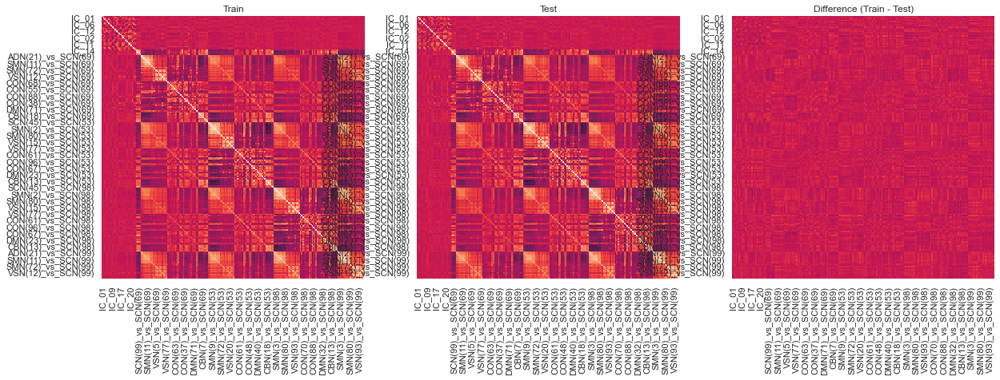

In [43]:
# Correlation matrix for top merged components
plot_corr_matrix(merge_train, merge_test, c_restrict=200)

### Plot correlation matrices between dataset types and target

In [44]:
def plot_corr_matrix_target(targets, df_train, c_restrict=100):

    # Merge target and feature matrix
    df_temp = pd.merge(targets.reset_index(), df_train.reset_index())
    df_temp = df_temp.set_index('Id').iloc[:, :c_restrict]
    
    # Correlation matrix for ICA components
    plt.figure(figsize=(16, 10))
    sns.heatmap(df_temp.corr().iloc[:5, 5:], square=True,
                vmin=-0.5, vmax=0.5, cbar=False, cmap='Spectral');

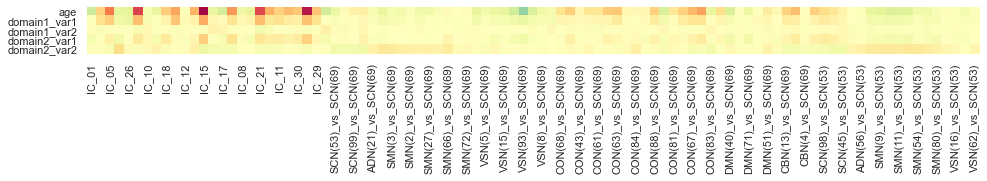

In [45]:
plot_corr_matrix_target(targets, merge_train)

### Plot pairplot between features and targets

In [46]:
def plot_pairplot(targets, df_train, r_restrict=10):

    # Merge target and feature matrix
    df_temp = pd.merge(targets.reset_index(), df_train.reset_index())
    df_temp = df_temp.set_index('Id')
    
    # Correlation matrix for ICA components
    for i in range(r_restrict):
        sns.pairplot(x_vars=['age', 'domain1_var1', 'domain1_var2', 'domain2_var1', 'domain2_var2'],
                     y_vars=df_temp.columns[i+5], data=df_temp)
        plt.show()

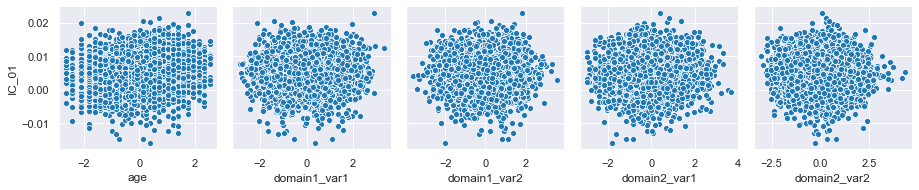

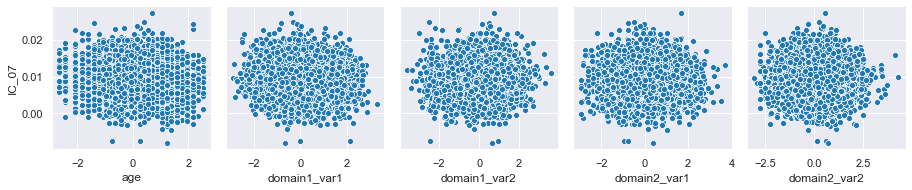

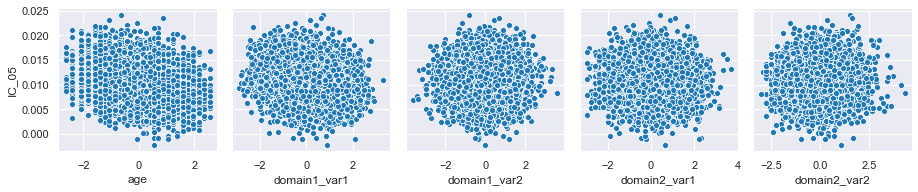

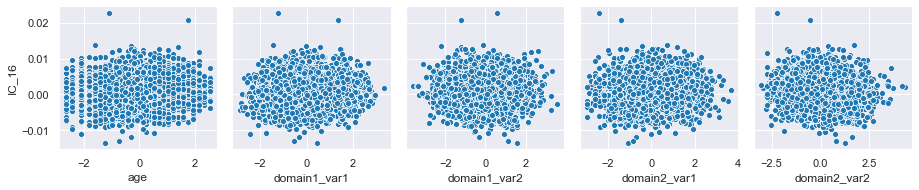

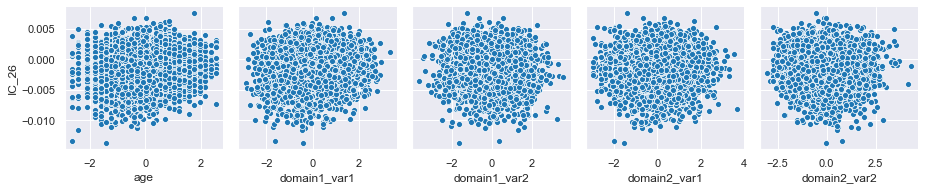

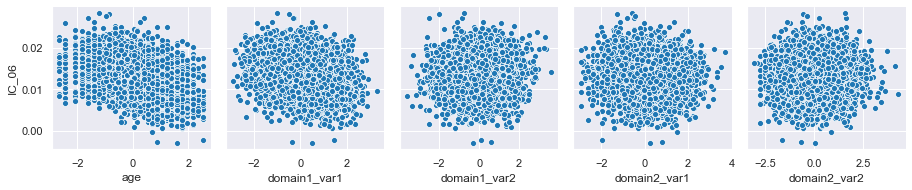

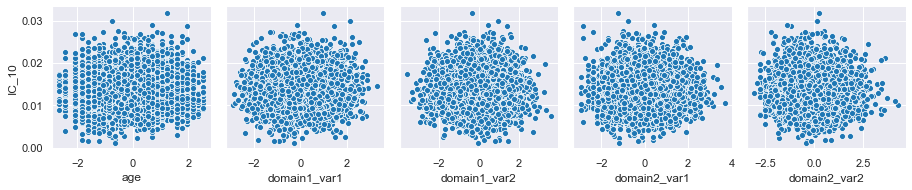

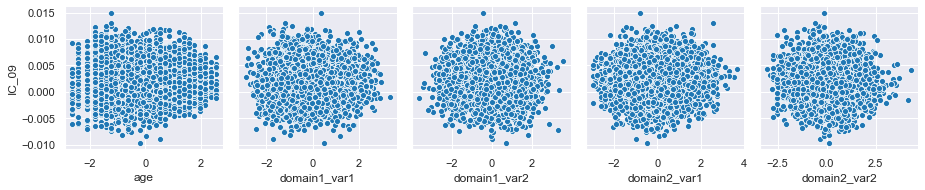

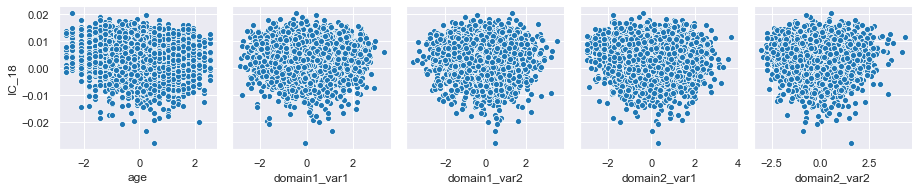

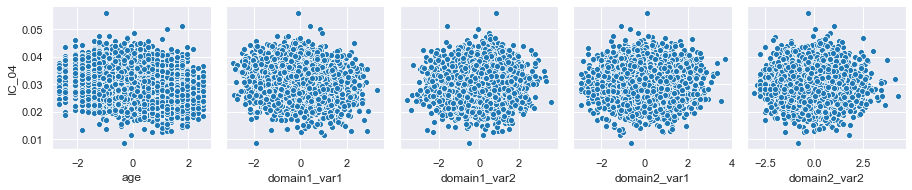

In [47]:
plot_pairplot(targets, ica_train, r_restrict=10)

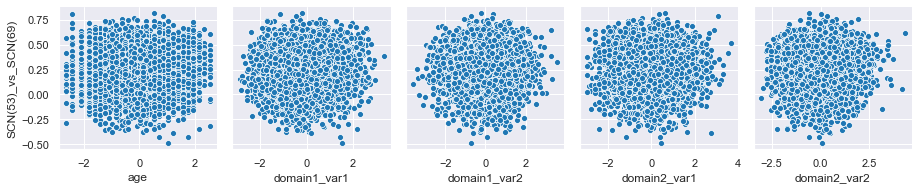

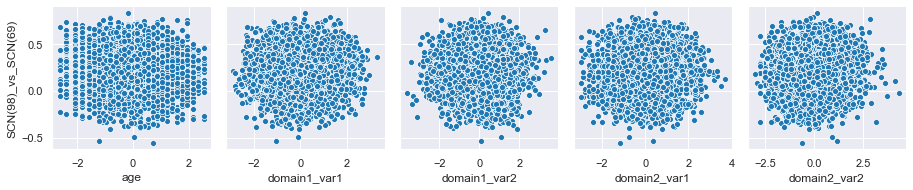

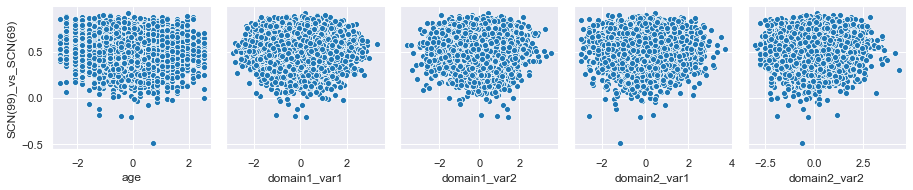

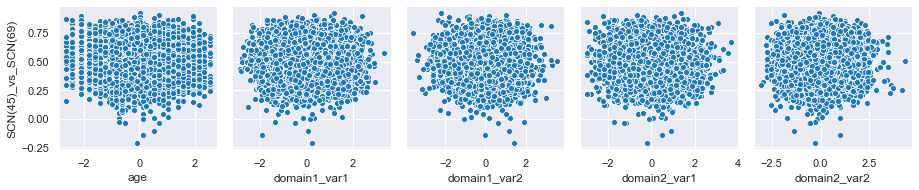

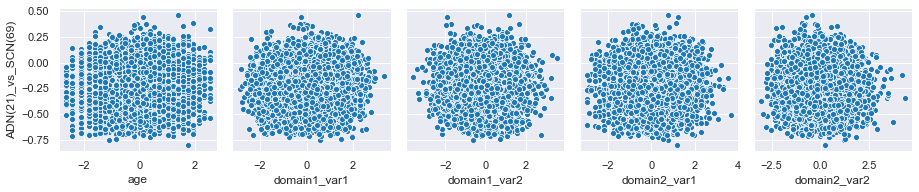

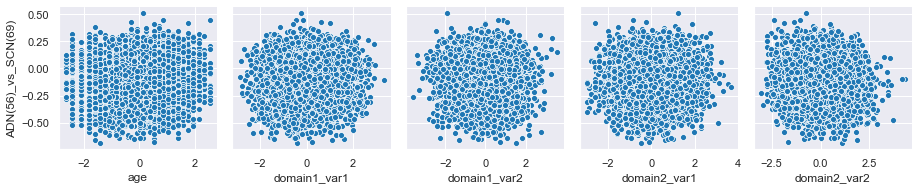

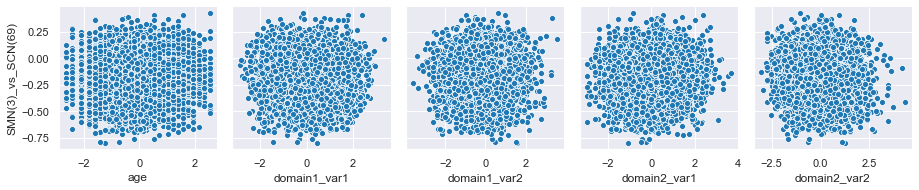

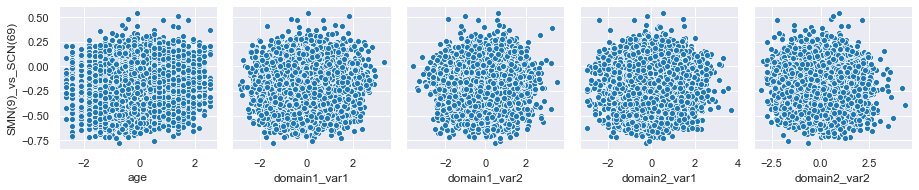

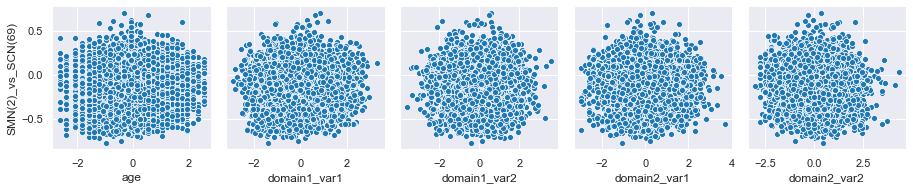

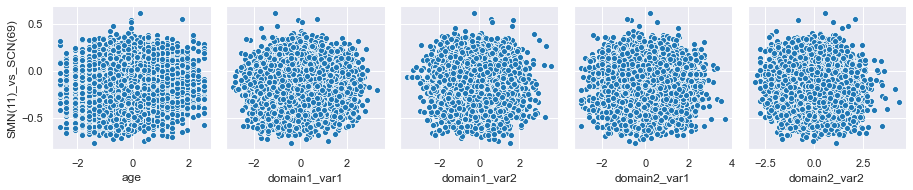

In [48]:
plot_pairplot(targets, fnc_train, r_restrict=10)

### Plot feature wise content and data range

#### Pairplot

In [49]:
# Number of columns to investigate
n_invest = 10

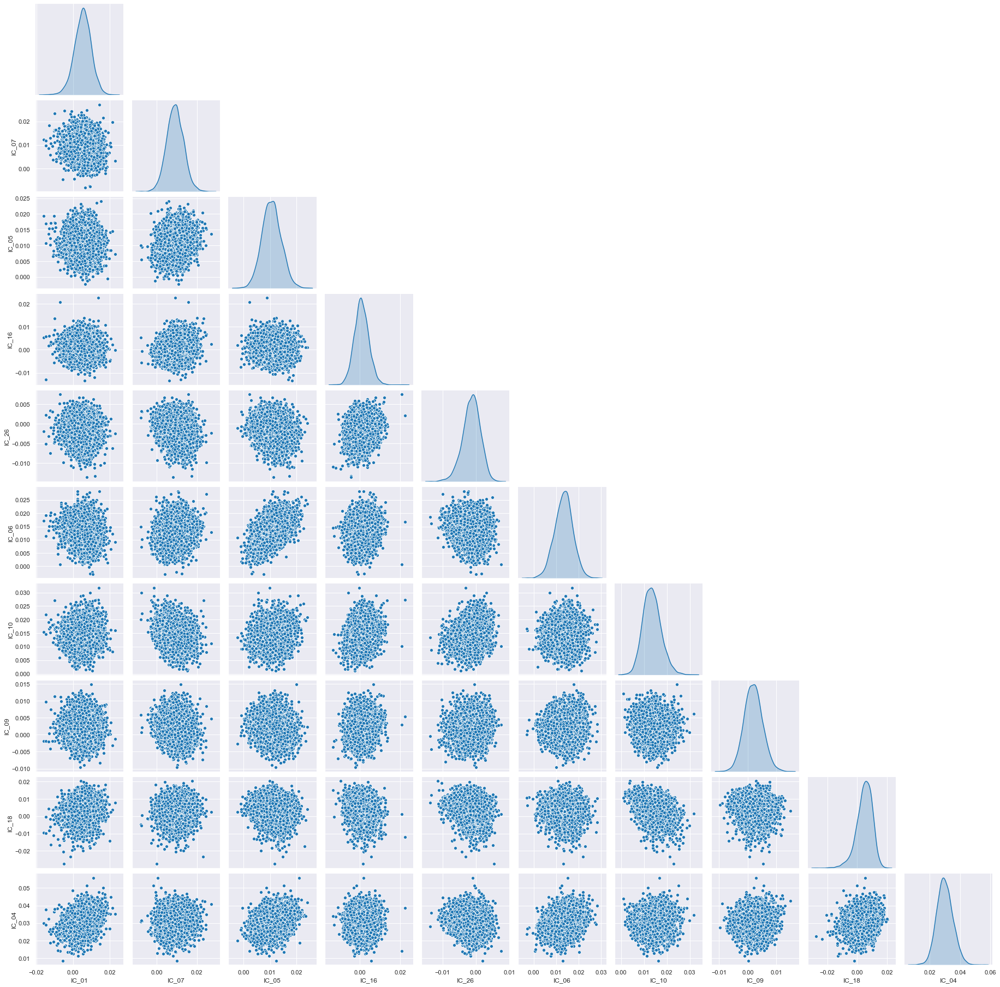

In [50]:
sns.pairplot(ica_train.iloc[:, :n_invest], diag_kind="kde", corner=True);

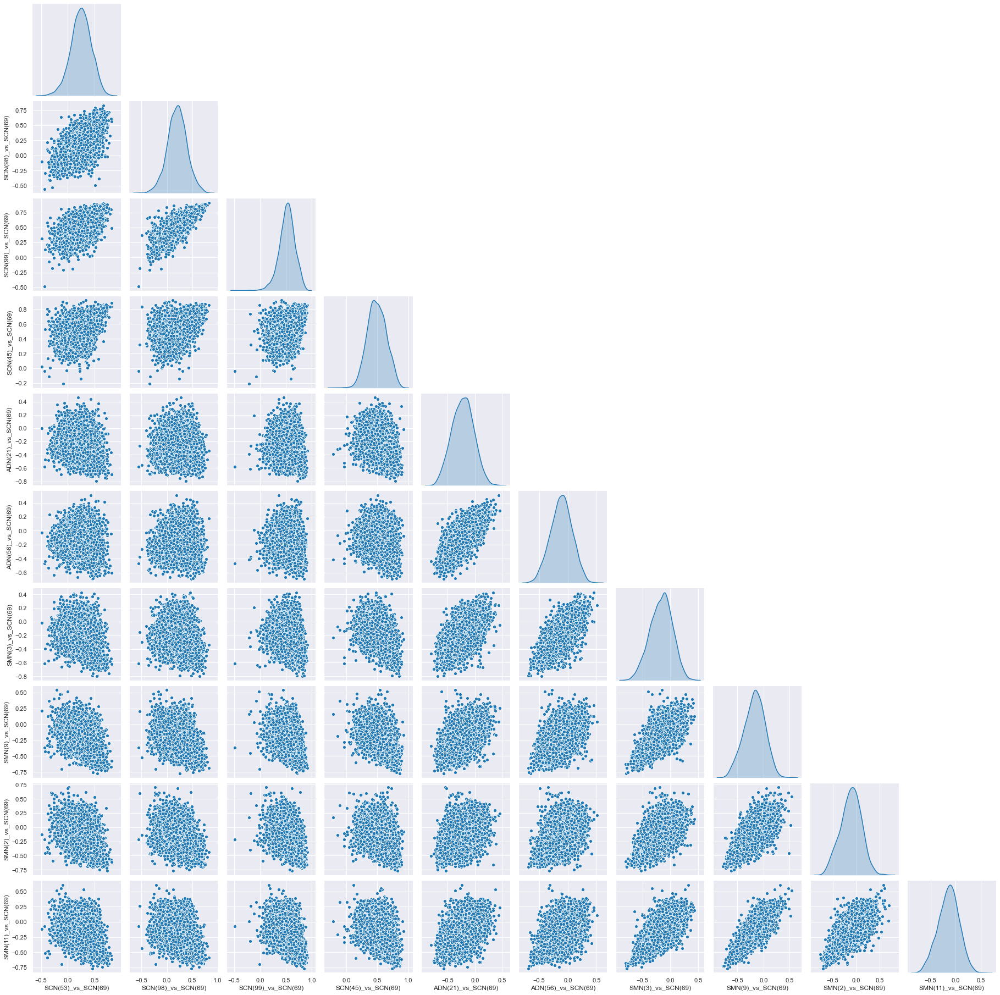

In [51]:
sns.pairplot(fnc_train.iloc[:, :n_invest], diag_kind="kde", corner=True);

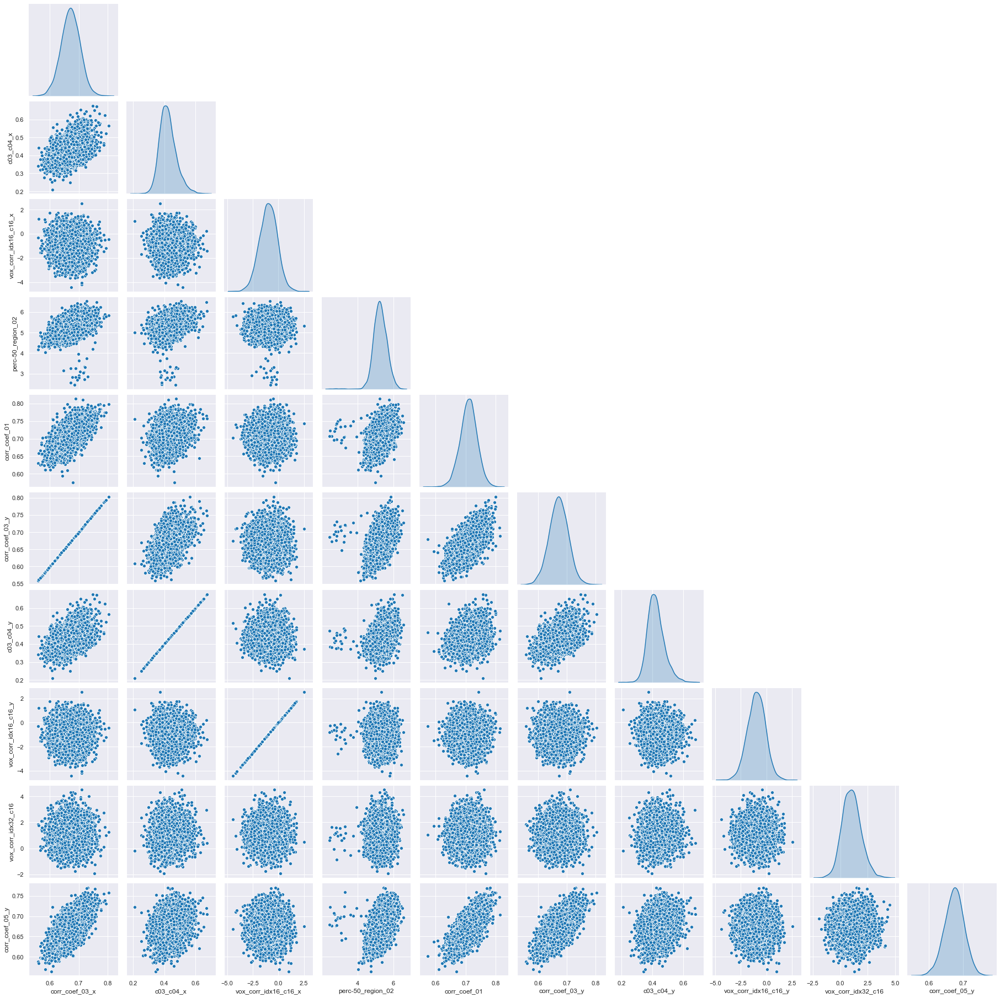

In [52]:
sns.pairplot(short_merge_train.iloc[:, -250::25], diag_kind="kde", corner=True);

#### Histograms

In [53]:
def plot_histograms(df_train, df_test, plot_max=20):

    # Select columns to plot
    cols = df_train.columns[:plot_max]
    
    for col in cols:
        plt.figure(figsize=(12, 2))
        sns.distplot(df_train[col], fit=norm, kde=False)
        sns.distplot(df_test[col], fit=norm, kde=False)
        plt.title(col)
        plt.show();

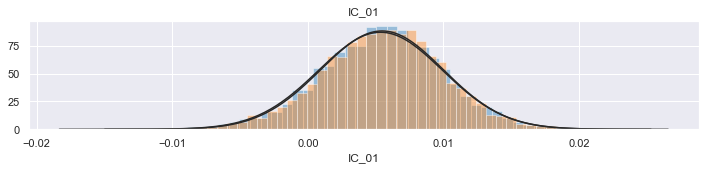

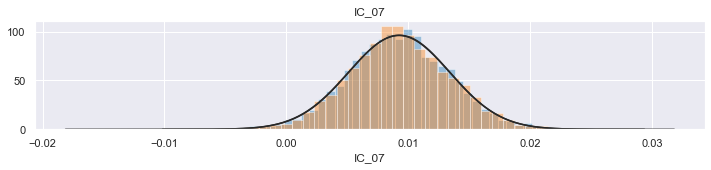

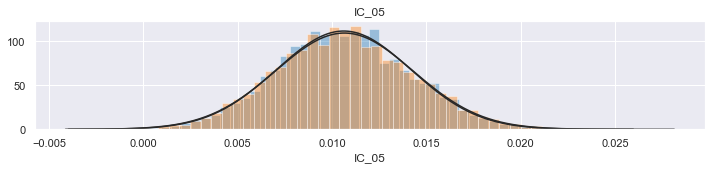

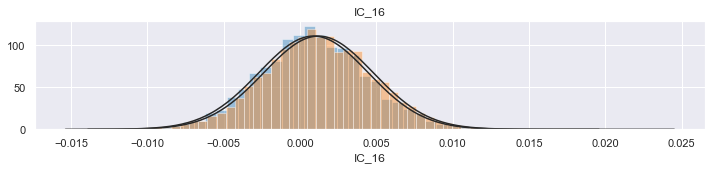

In [54]:
plot_histograms(ica_train, ica_test, plot_max=4)

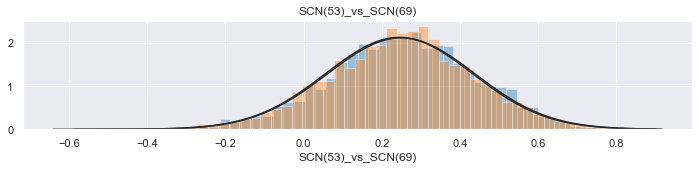

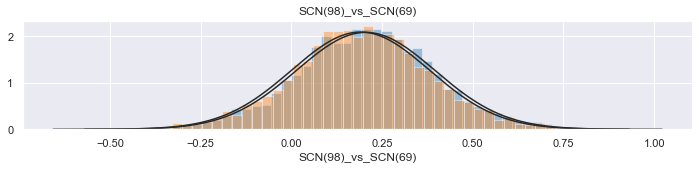

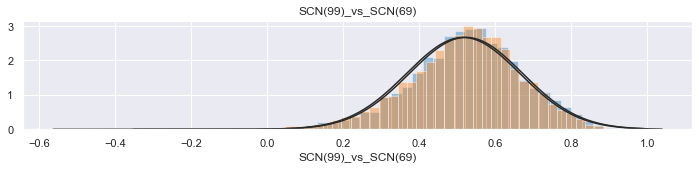

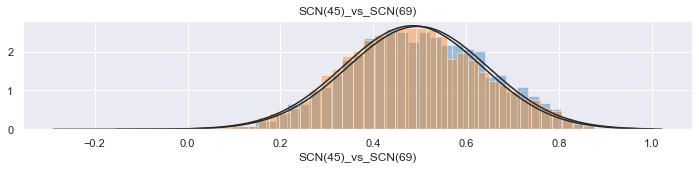

In [55]:
plot_histograms(fnc_train, fnc_test, plot_max=4)

#### Marker plot

In [56]:
def plot_markers(key, df_temp, ncolmarker=5, split_at=10, plot_max=20):

    # Restrict dataframe to first X features
    df_temp = df_temp.iloc[:, :plot_max]

    # Compute dataset selecters
    ncolumns = np.arange(df_temp.shape[1])
    selecter = np.split(ncolumns, ncolumns[::split_at][1:])

    for s in selecter:

        print(key, s)
        df_temp.iloc[:, s].plot(kind='line',subplots=True, sharex=True, marker='.', lw=0,
                                ms=10, markeredgecolor='k', markeredgewidth=0.3,
                     figsize=(5 * ncolmarker, 4 * df_temp.iloc[:, s].shape[1]//ncolmarker), layout=(-1,ncolmarker));
        plt.show()

ica_train [0 1 2 3 4 5 6 7 8 9]


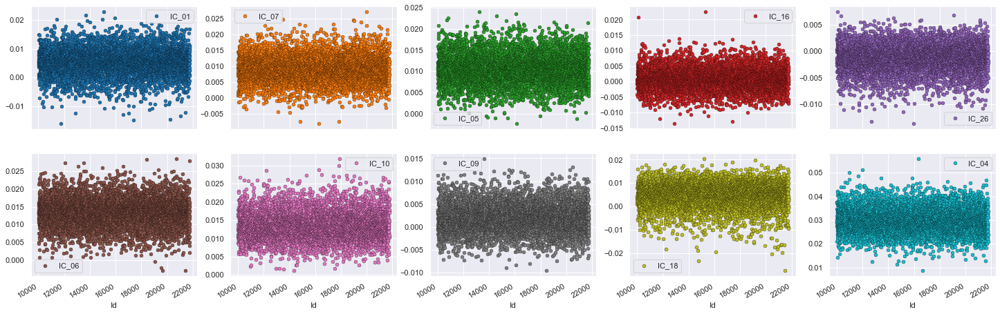

ica_train [10 11 12 13 14 15 16 17 18 19]


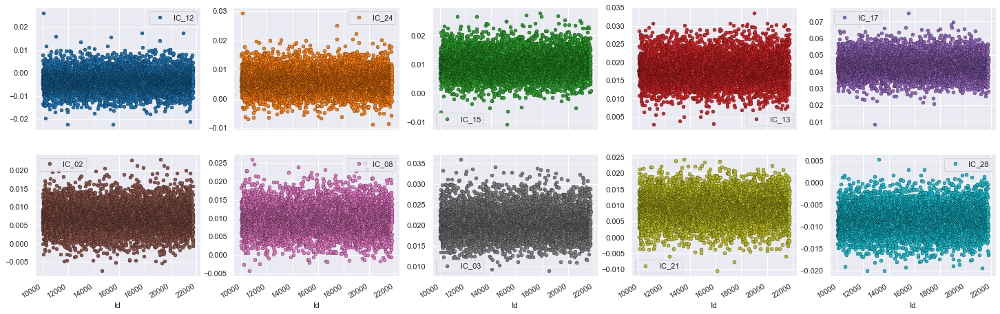

In [57]:
plot_markers('ica_train', ica_train)

fnc_train [0 1 2 3 4 5 6 7 8 9]


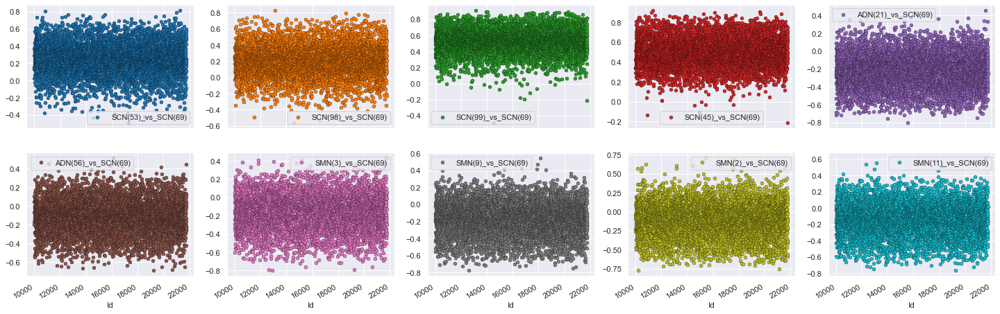

fnc_train [10 11 12 13 14 15 16 17 18 19]


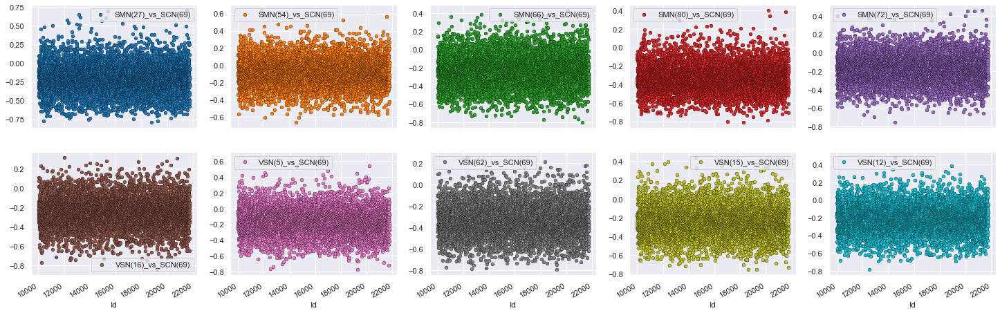

In [58]:
plot_markers('fnc_train', fnc_train)

short_merge_train [0 1 2 3 4 5 6 7 8 9]


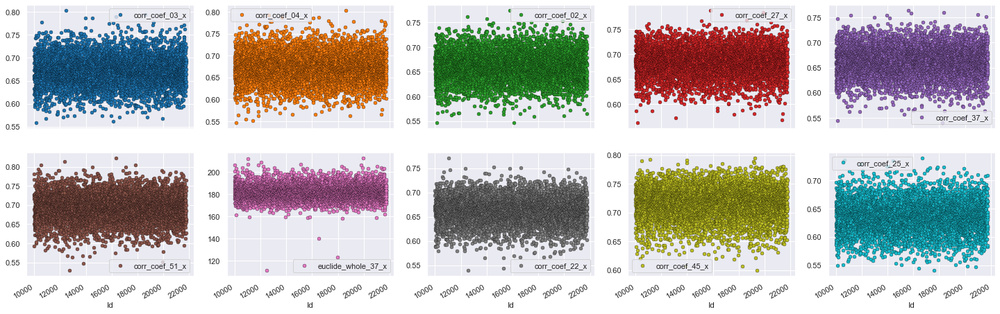

short_merge_train [10 11 12 13 14 15 16 17 18 19]


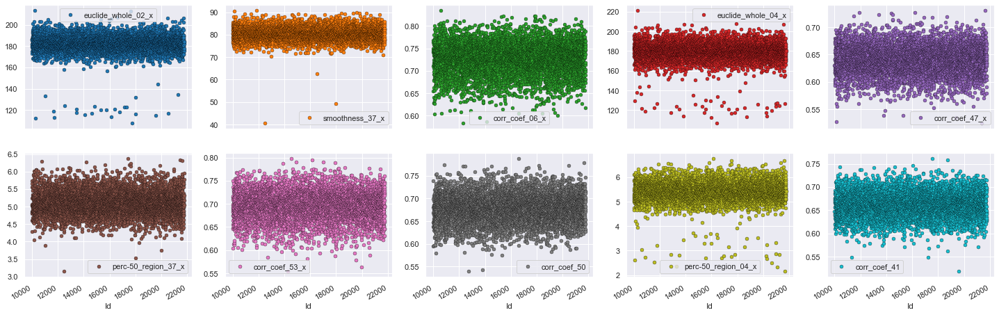

In [59]:
plot_markers('short_merge_train', short_merge_train.iloc[:, -250::])

## 2.3. Save feature datasets in CSV files

In [34]:
# Store as CSV files
merge_train = pd.merge(ica_train.reset_index(), fnc_train.reset_index()).set_index('Id')
merge_train = merge_train.drop(outliers, errors='ignore')
merge_test = pd.merge(ica_test.reset_index(), fnc_test.reset_index()).set_index('Id')

merge_train.to_csv('datasets/merge_train.csv')
merge_test.to_csv('datasets/merge_test.csv')
merge_train.shape

(5825, 1404)

In [61]:
# Store as CSV files
short_merge_train.to_csv('datasets/short_merge_train.csv')
short_merge_test.to_csv('datasets/short_merge_test.csv')
short_merge_train.shape

(5825, 1654)

## 2.5. Explore feature datasets explained variance via PCA

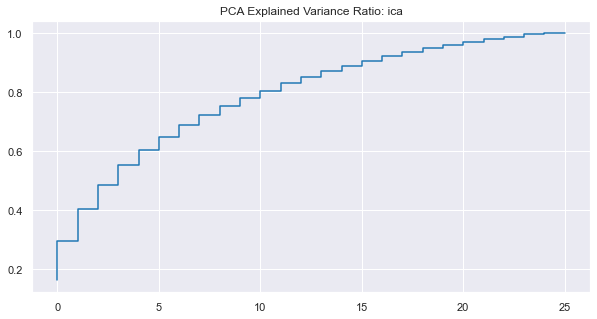

Explained Variance for ica: 80% | Components: 11
Explained Variance for ica: 90% | Components: 16
Explained Variance for ica: 95% | Components: 20
Explained Variance for ica: 99% | Components: 24


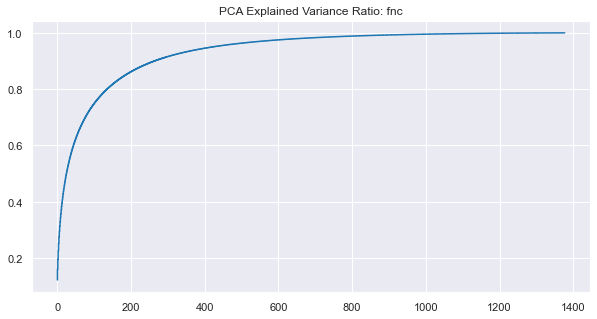

Explained Variance for fnc: 80% | Components: 136
Explained Variance for fnc: 90% | Components: 264
Explained Variance for fnc: 95% | Components: 422
Explained Variance for fnc: 99% | Components: 834


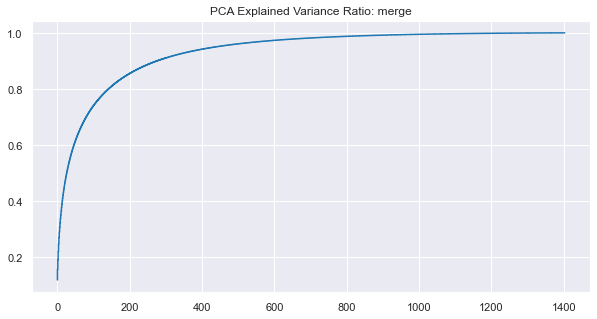

Explained Variance for merge: 80% | Components: 142
Explained Variance for merge: 90% | Components: 276
Explained Variance for merge: 95% | Components: 438
Explained Variance for merge: 99% | Components: 854


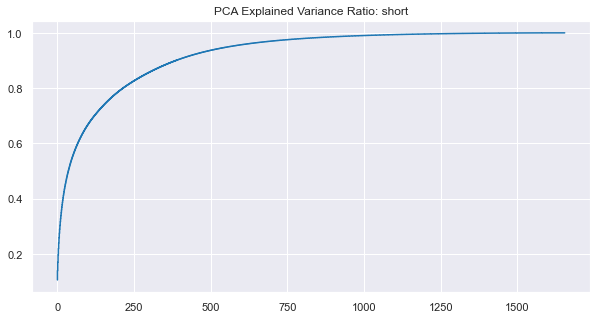

Explained Variance for short: 80% | Components: 215
Explained Variance for short: 90% | Components: 387
Explained Variance for short: 95% | Components: 561
Explained Variance for short: 99% | Components: 993


In [37]:
for key, df_temp in [['ica', ica_train],
                     ['fnc', fnc_train],
                     ['merge', merge_train],
                     ['short', short_merge_train]]:

    # Explore explained variance on PCA components
    scaler = StandardScaler()
    scaled = scaler.fit_transform(df_temp)

    # Create PCA reduced dataset
    pca = PCA()
    pca_train = pca.fit_transform(scaled)

    # Explore PCA components
    pve_cumsum = np.cumsum(pca.explained_variance_ratio_)
    plt.figure(figsize=(10, 5))
    plt.title('PCA Explained Variance Ratio: %s' % key)
    plt.step(range(len(pve_cumsum)), pve_cumsum)
    plt.show();
    
    for thresh in [0.8, 0.9, 0.95, 0.99]:
        txt = 'Explained Variance for {}: {}% | Components: {}'.format(
            key, int(thresh * 100),
            np.argmax(pve_cumsum>=thresh))
        print(txt)